## Import modules

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm
plt.style.use('ggplot')

# So we can see the output of multiple variables in a single cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import moviepy

np.__version__
moviepy.__version__

'0.2.3.1'

## Calibrate, Undistort, Unwarp

## Calibrate

### Obtain chessboard corners

In [81]:
# Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Create a list with all of the calibration images
image_cals = glob.glob('cal-images/cal*')

# Step through the list and search for chessboard corners
for idx, fname in tqdm(enumerate(image_cals)):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

20it [00:06,  3.04it/s]


### Take a look at one particular calibration's _objpoints_ and _imgpoints_

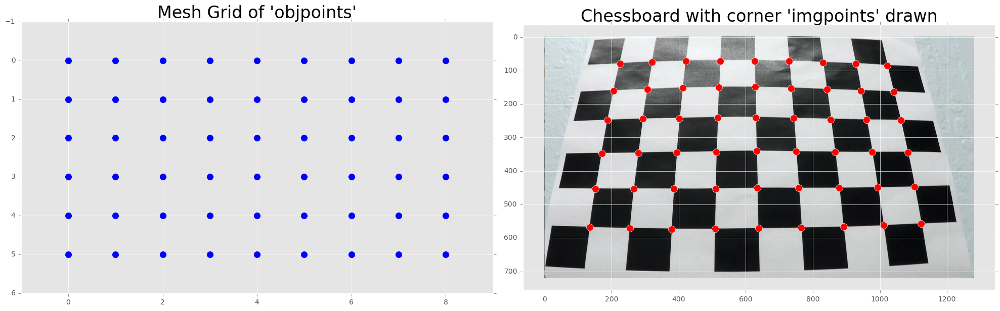

In [3]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
f.tight_layout()

ax1.set_title('Mesh Grid of \'objpoints\'', fontdict={'fontsize':24}, y=1.0)
ax1.scatter(x=objp[:,0], y=objp[:,1], s=100)
ax1.set_ylim(6, -1)

ax2.set_title('Chessboard with corner \'imgpoints\' drawn', fontdict={'fontsize':24}, y=1.0)
example_cal_image = cv2.imread(image_cals[-7])
ax2.imshow(example_cal_image)

# Prepare corners for drawing on selected cal. image
corners = np.squeeze(imgpoints[-5])
ax2.scatter(corners[:,0], corners[:,1], c='r', s=100);

## Undistort

### Undisort the image

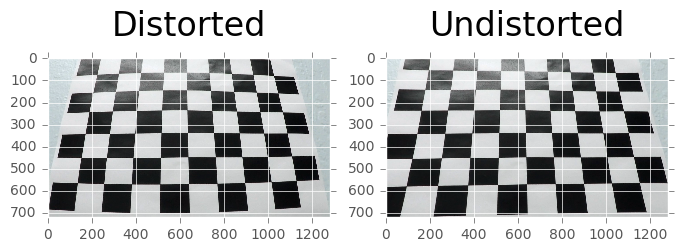

In [4]:
# Load a test image to see how it will become undistored (and to get its size)
test_image = cv2.imread(image_cals[-7])
img_size = (test_image.shape[1], test_image.shape[0])

# Perform camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size ,None,None)

# This function will end up in the pipeline!
def undistort_img(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

undistort = undistort_img(test_image, mtx, dist)
    
# Let's see a comarison of 'distorted' and 'undistorted'
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,6))
ax1.set_title('Distorted', fontdict={'fontsize':24}, y=1.1)
ax1.imshow(test_image)
ax2.set_title('Undistorted', fontdict={'fontsize':24}, y=1.1)
ax2.imshow(undistort);

## Unwarp

### Unwarp Image

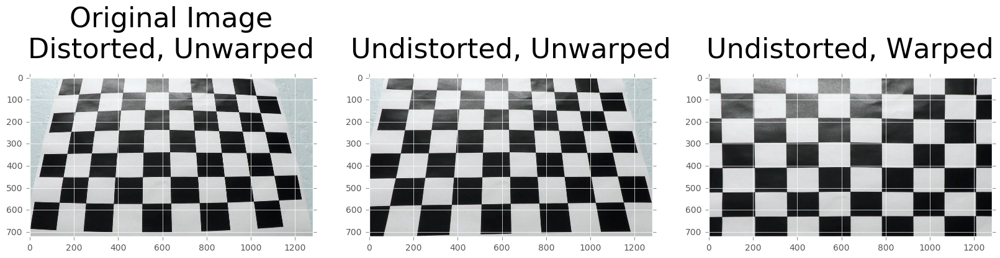

In [5]:
# Setup values for 'src' and 'dst' points
offset = 100 # to offset 'dst' points
nx = 9
ny = 6

# Grab the four outer corners of the board as 'src' points. Top left, CW
src = np.float32([corners[0],
                  corners[nx-1],
                  corners[-1],
                  corners[-nx]])

# Create a list of 'dst' points by drawing a large rectangle with the points. Top left, CW
dst = np.float32([[offset,offset],
                  [img_size[0]-offset,offset],
                  [img_size[0]-offset,img_size[1]-offset],
                  [offset, img_size[1]-offset]])

# Compute the perspective transform, M, given source and destination points
M = cv2.getPerspectiveTransform(src, dst)

# Compute the inverse perspective transform:
Minv = cv2.getPerspectiveTransform(dst, src)

# Unwarp an image using the perspective(img, M, img_size, flags=cv2.INTER_LINEAR)
warped = cv2.warpPerspective(undistort, M, img_size, flags=cv2.INTER_LINEAR)

# This function will end up in the pipeline!
def unwarp(src, dst, img, M, img_size):
    # Compute the perspective transform, M, given source and destination points
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Unwarp an image using the perspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
# This function will end up in the pipeline!
def warp(img , dst, src):
    # Compute the inverse perspective transform:
    Minv = cv2.getPerspectiveTransform(dst, src)
    
# Let's see a comparison of an undistorde, unwarped picture and its warped counterpart
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,6))
ax1.set_title('Original Image\nDistorted, Unwarped', fontdict={'fontsize':32}, y=1.1)
ax1.imshow(test_image)
ax2.set_title('Undistorted, Unwarped', fontdict={'fontsize':32}, y=1.1)
ax2.imshow(undistort)
ax3.set_title('Undistorted, Warped', fontdict={'fontsize':32}, y=1.1)
ax3.imshow(warped);

## Pipeline

### Undistort image

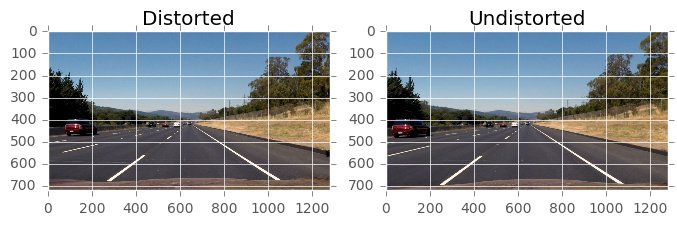

In [6]:
image = cv2.imread('test-images/straight_lines2.jpg')
image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
undistort = undistort_img(image_RGB, mtx, dist)

# Let's see a comarison of 'distorted' and 'undistorted'
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,6))
ax1.set_title('Distorted')
ax1.imshow(image_RGB)
ax2.set_title('Undistorted')
ax2.imshow(undistort);

### Image Pipeline Functions

In [74]:
def apply_undistort(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

def apply_BGR2HLS(img):
    # input is BGR image and output is a HLS image
    return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

def return_h_channel(img, thresh=(0,255)):
    # input is a HLS image and output is only the H Channel thresholded
    h_channel = img[:,:,0]
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel > thresh[0]) & (h_channel < thresh[1])] = 1
    return h_binary

def return_l_channel(img, thresh=(0,255)):
    # input is a HLS image and output is only the L Channel thresholded
    l_channel = img[:,:,1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel > thresh[0]) & (l_channel < thresh[1])] = 1
    return l_binary

def return_s_channel(img, thresh=(0,255)):
    # input is a HLS image and output is only the S Channel thresholded
    s_channel = img[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > thresh[0]) & (s_channel < thresh[1])] = 1
    return s_binary

def apply_sobel_thresh(img, orient='x', ksize=3, thresh=(0,255)):   
    # Determine Sobel orientation
    if 'x' in orient:
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=ksize)
    else:
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=ksize)
    # We only to work with positive gradients from the sobel covolution
    sobel_abs = np.absolute(sobel)
    # Scale the gradients to 8-bit (0-255) values
    sobel_scaled = np.uint8(255*sobel_abs / np.max(sobel_abs))
    # Apply a low and high pass threshold filter
    sobel_binary = np.zeros_like(sobel_scaled)
    sobel_binary[(sobel_scaled > thresh[0]) & (sobel_scaled < thresh[1])] = 1
    return sobel_binary

def apply_dir_thresh(img, ksize=3, thresh=(0, np.pi/2)):
    # Apply the following steps to img
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=ksize)
    # Take the absolute value of the x and y gradients
    sobelx_abs = np.absolute(sobelx)
    sobely_abs = np.absolute(sobely)
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    arctan = np.arctan2(sobely_abs, sobelx_abs)
    # Create a binary mask where direction thresholds are met
    sobel_binary = np.zeros_like(arctan)
    sobel_binary[(arctan > thresh[0]) & (arctan < thresh[1])] = 1
    # Return this mask as your binary_output image
    return sobel_binary

def apply_mag_thresh(img, ksize=3, thresh=(0, 255)):
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=ksize)
    # Calculate the magnitude
    sobel_mag = np.sqrt(np.square(sobelx) + np.square(sobely))
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    sobel_scale = np.uint8(sobel_mag*255 / np.max(sobel_mag))
    # Create a binary mask where mag thresholds are met
    sobel_binary = np.zeros_like(sobel_scale)
    sobel_binary[(sobel_scale > thresh[0]) & (sobel_scale < thresh[1])] = 1
    # Return this mask as your binary_output image
    return sobel_binary

# Hardcode src and dst points for warping/perspective
src = np.float32(
    [[(img_size[0] / 2) - 60, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 50, img_size[1]],
    [(img_size[0] / 2 + 65), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

def apply_perpspective(img, src, dst):
    # Set the size (x, y)
    img_size = (img.shape[1], img.shape[0])
    # Compute the perspective transform, M, given source and destination points
    M = cv2.getPerspectiveTransform(src, dst)
    # Unwarp an image using the perspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
def apply_unwarp(img, src, dst):
    # Image size
    img_size = (img.shape[1], img.shape[0])
    # Compute the perspective transform, M, given source and destination points
    M = cv2.getPerspectiveTransform(src, dst)
    # Unwarp an image using the perspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

### Test out various color channels, thresholds, gradient directions, etc

## HLS variations

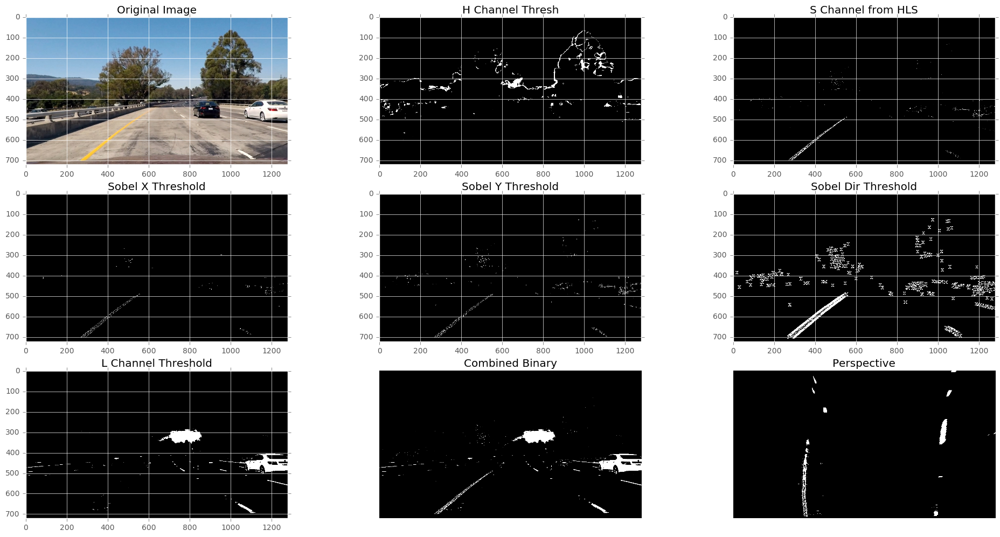

In [73]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3,3, figsize=(24,12))

image = cv2.imread('test-images/test1.jpg')
image = apply_undistort(image, mtx, dist)
image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ax1.set_title('Original Image')
ax1.imshow(image_RGB)

image_hls = apply_BGR2HLS(image)
# ax2.set_title('HLS')
# ax2.imshow(image_hls)

# H_Channel Threshold
h_binary = return_h_channel(image_hls, thresh=(50,100))
ax2.set_title('H Channel Thresh')
ax2.imshow(h_binary, cmap='gray')

# S_Channel Threshold
s_binary = return_s_channel(image_hls, thresh=(220,255))
ax3.set_title('S Channel from HLS')
ax3.imshow(s_binary, cmap='gray')

sobel_x = apply_sobel_thresh(s_binary, ksize=9, thresh=(70,100))
ax4.set_title('Sobel X Threshold')
ax4.imshow(sobel_x, cmap='gray')

sobel_y = apply_sobel_thresh(s_binary, orient='y', ksize=5, thresh=(50,100))
ax5.set_title('Sobel Y Threshold')
ax5.imshow(sobel_y, cmap='gray')

sobel_dir = apply_dir_thresh(s_binary, ksize=15, thresh=(0.7, 1.3))
ax6.set_title('Sobel Dir Threshold')
ax6.imshow(sobel_dir, cmap='gray')

sobel_mag = apply_mag_thresh(s_binary, ksize=5, thresh=(30,100))
# ax7.set_title('Sobel Mag Threshold')
# ax7.imshow(sobel_mag, cmap='gray')

# L channel
l_binary = return_l_channel(image_hls, thresh=(200,255))
ax7.set_title('L Channel Threshold')
ax7.imshow(l_binary, cmap='gray')

# Combine Thresholded values
combined_binary = np.zeros_like(s_binary)
combined_binary[((sobel_x==1) & (sobel_y==1))
               | (l_binary==1)
               | (s_binary==1)] = 1

ax8.set_title('Combined Binary')
ax8.set_axis_off()
ax8.imshow(combined_binary, cmap='gray');

plt.title('Perspective')
plt.axis('off')
plt.imshow(apply_perpspective(combined_binary, src, dst), cmap='gray')
plt.show();

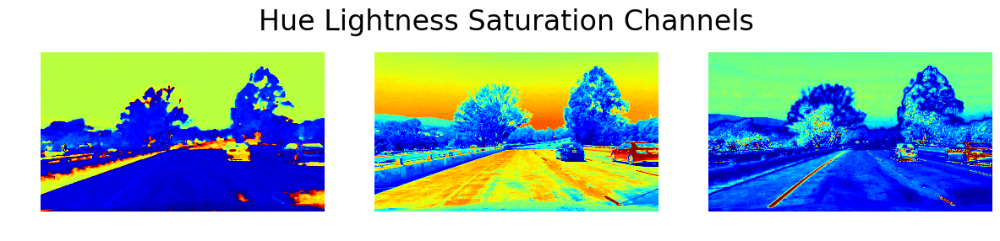

100%|████████████████████████████████████████████| 5/5 [00:02<00:00,  1.81it/s]


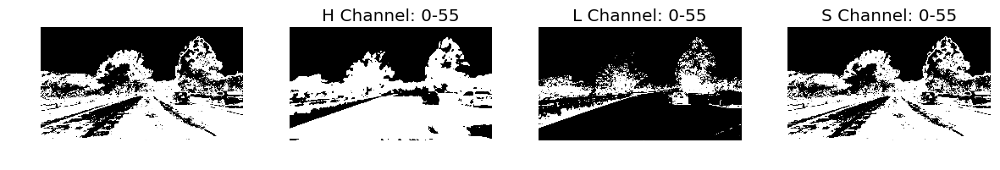

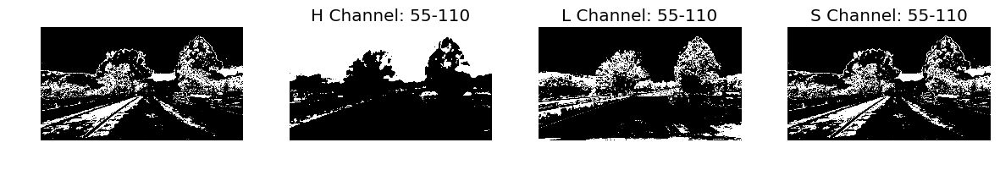

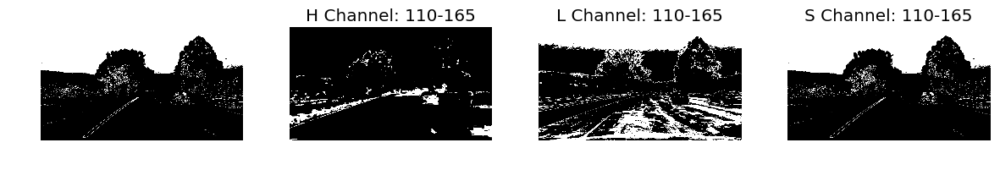

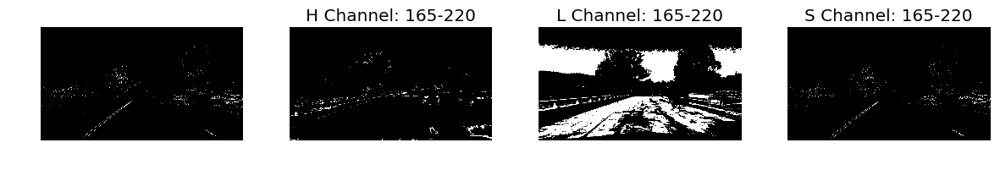

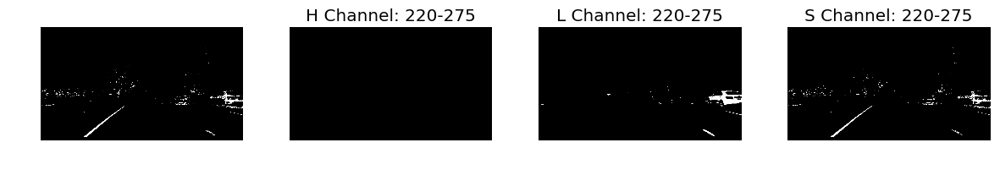

In [9]:
image_h = image_hls[:,:,0]
image_l = image_hls[:,:,1]
image_s = image_hls[:,:,2]

fig, _ = plt.subplots(1,3, figsize=(12,12))
fig.suptitle('Hue Lightness Saturation Channels', y=0.63, fontsize=24)
fig.tight_layout()
# Plot 
plt.subplot(1,3,1)
plt.axis('off')
plt.imshow(image_h)
# Plot 
plt.subplot(1,3,2)
plt.axis('off')
plt.imshow(image_l)
# Plot
plt.subplot(1,3,3)
plt.axis('off')
plt.imshow(image_s)
plt.show();


for iter in tqdm(range(0,255,55)):
    step = 55

    h_binary = np.zeros_like(image_h)
    h_binary[(image_h > iter) & (image_h < iter+step)] = 1
    l_binary = np.zeros_like(image_l)
    l_binary[(image_l > iter) & (image_l < iter+step)] = 1
    s_binary = np.zeros_like(image_s)
    s_binary[(image_s > iter) & (image_s < iter+step)] = 1

    
    plt.subplots(1,4, figsize=(12,12))
    
    # Orig HLS
    plt.subplot(1,4,1)
    plt.axis('off')
    plt.tight_layout()
    plt.imshow(s_binary, cmap='gray')

    # H Channel
    plt.subplot(1,4,2)
    plt.axis('off')
    plt.tight_layout()
    plt.title('H Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(h_binary, cmap='gray')
    
    # L Channel
    plt.subplot(1,4,3)
    plt.axis('off')
    plt.tight_layout()
    plt.title('L Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(l_binary, cmap='gray')
    
    # S Channel
    plt.subplot(1,4,4)
    plt.axis('off')
    plt.tight_layout()
    plt.title('S Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(s_binary, cmap='gray')
    
plt.show();

## RGB variations

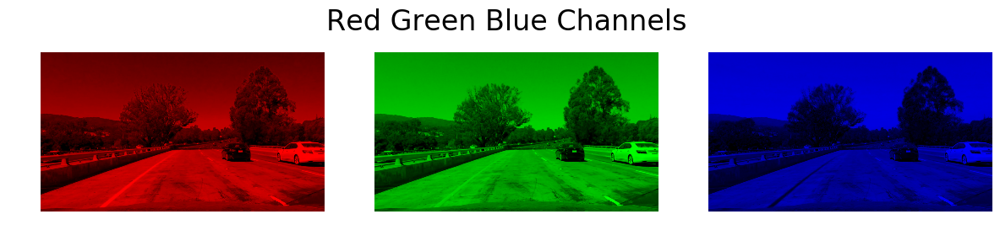

100%|████████████████████████████████████████████| 5/5 [00:02<00:00,  1.86it/s]


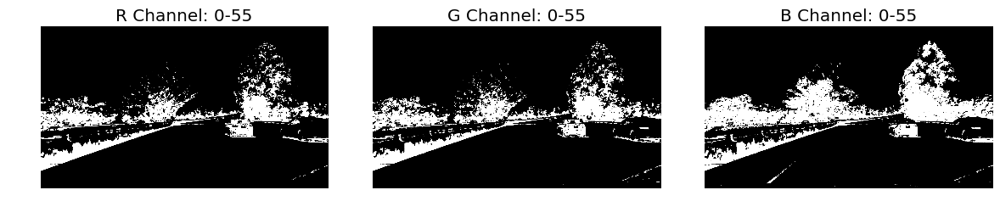

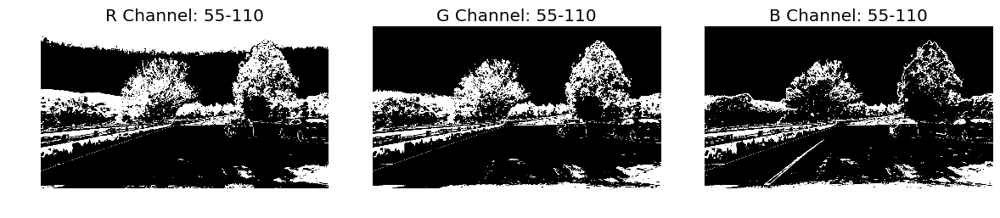

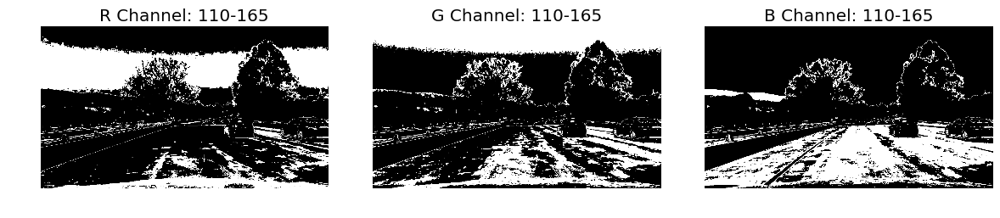

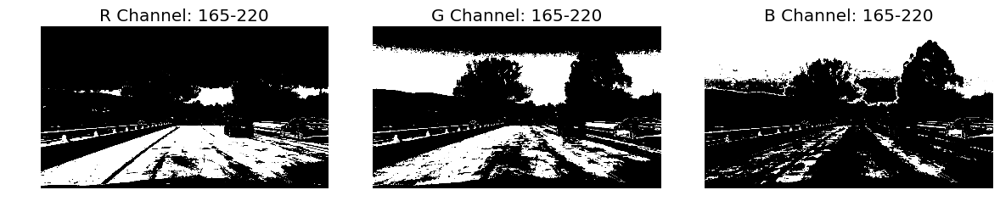

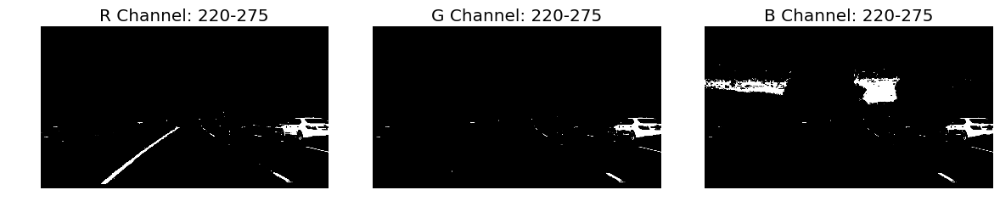

In [76]:
# Test out RGB color channels
R = np.dstack((image_RGB[:,:,0], np.zeros_like(image_RGB[:,:,0]), np.zeros_like(image_RGB[:,:,0])))
G = np.dstack((np.zeros_like(image_RGB[:,:,0]), image_RGB[:,:,1], np.zeros_like(image_RGB[:,:,0])))
B = np.dstack((np.zeros_like(image_RGB[:,:,0]), np.zeros_like(image_RGB[:,:,0]), image_RGB[:,:,2]))

fig, _ = plt.subplots(1,3, figsize=(12,12))
fig.suptitle('Red Green Blue Channels', y=0.63, fontsize=24)
fig.tight_layout()
# Plot Red
plt.subplot(1,3,1)
plt.axis('off')
plt.imshow(R)
# Plot Green
plt.subplot(1,3,2)
plt.axis('off')
plt.imshow(G)
# Plot Blue
plt.subplot(1,3,3)
plt.axis('off')
plt.imshow(B)
plt.show();

R = R[:,:,0]
G = G[:,:,1]
B = B[:,:,2]
r_binary = np.zeros_like(R)
r_binary[(R > 0) & (R < 50)] = 1
g_binary = np.zeros_like(G)
g_binary[(G > 30) & (G < 100)] = 1
b_binary = np.zeros_like(B)
b_binary[(B > 30) & (B < 100)] = 1

# fig, _ = plt.subplots(1,3, figsize=(12,12))
# fig.suptitle('Red Green Blue Channels Binary Masks', y=0.63, fontsize=24)
# fig.tight_layout()
# # Plot Red
# plt.subplot(1,3,1)
# plt.axis('off')
# plt.imshow(r_binary, cmap='gray')
# # Plot Green
# plt.subplot(1,3,2)
# plt.axis('off')
# plt.imshow(g_binary, cmap='gray')
# # Plot Blue
# plt.subplot(1,3,3)
# plt.axis('off')
# plt.imshow(b_binary, cmap='gray')
# plt.show();

for iter in tqdm(range(0,255,55)):
    step = 55

    r_binary = np.zeros_like(R)
    r_binary[(R > iter) & (R < iter+step)] = 1
    g_binary = np.zeros_like(G)
    g_binary[(G > iter) & (G < iter+step)] = 1
    b_binary = np.zeros_like(B)
    b_binary[(B > iter) & (B < iter+step)] = 1
    
    plt.subplots(1,3, figsize=(12,12))
    # Plot Red
    plt.subplot(1,3,1)
    plt.axis('off')
    plt.tight_layout()
    plt.title('R Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(r_binary, cmap='gray')
    # Plot Green
    plt.subplot(1,3,2)
    plt.axis('off')
    plt.tight_layout()
    plt.title('G Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(g_binary, cmap='gray')
    # Plot Blue
    plt.subplot(1,3,3)
    plt.axis('off')
    plt.tight_layout()
    plt.title('B Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(b_binary, cmap='gray')

plt.show();

### Image Pipeline

In [78]:
def image_pipe(img, mtx=mtx, dist=dist):
    
    # Undistort BGR image
    undistort = apply_undistort(img, mtx, dist)
    # Return only H channel from HLS conversion
    l_binary = return_l_channel(undistort, thresh=(200,255))
    # Return only H channel from HLS conversion
    s_binary = return_s_channel(undistort, thresh=(220,255))
    # Return gradient in the vertical direction
    sobel_x = apply_sobel_thresh(s_binary, ksize=15, thresh=(30,100))
    # Return gradient in the horizontal direction
    sobel_y = apply_sobel_thresh(s_binary, orient='y', ksize=15, thresh=(50,100))
    # Return only gradients in a particular direction
    sobel_dir = apply_dir_thresh(s_binary, ksize=13, thresh=(0.7, 1.3))
    # Return only gradients that meet a certain threshold
    sobel_mag = apply_mag_thresh(s_binary, ksize=5, thresh=(30,100))
    # Grab  Red, Green, Blue color channels
    B = undistort[:,:,0]
    G = undistort[:,:,1]
    R = undistort[:,:,2]
    R_binary, G_binary, B_binary = np.zeros_like(R), np.zeros_like(G), np.zeros_like(B)
    R_binary[(R > 245) & (R < 255)] = 1
    G_binary[(G > 215) & (G < 255)] = 1
    B_binary[(B > 215) & (B < 255)] = 1
    # Combine Thresholded values
    combined_binary = np.zeros_like(s_binary)
    combined_binary[((sobel_x==1) & (sobel_y==1))
                   | (l_binary==1)
                   | (s_binary==1)
                   | (G_binary==1)
                   | (R_binary==1) 
                   | (B_binary==1)] = 1
    return combined_binary

#### Test Image Pipeline on multiple test images

100%|██████████████████████████████████████████| 10/10 [00:04<00:00,  2.24it/s]


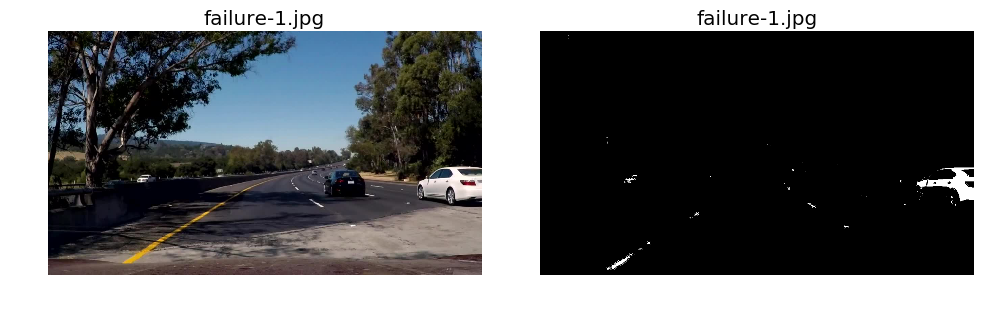

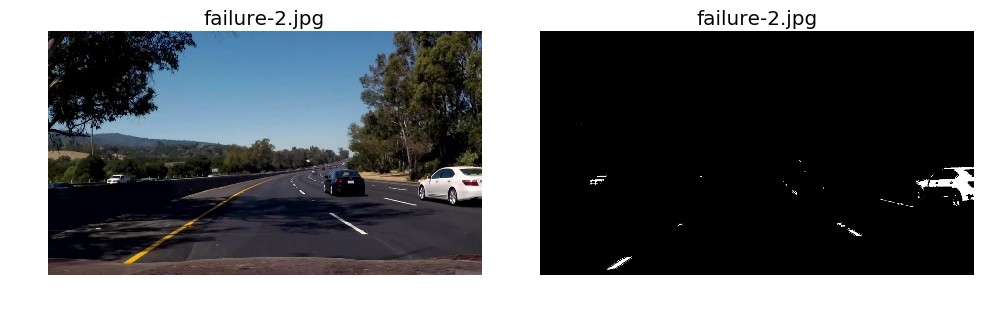

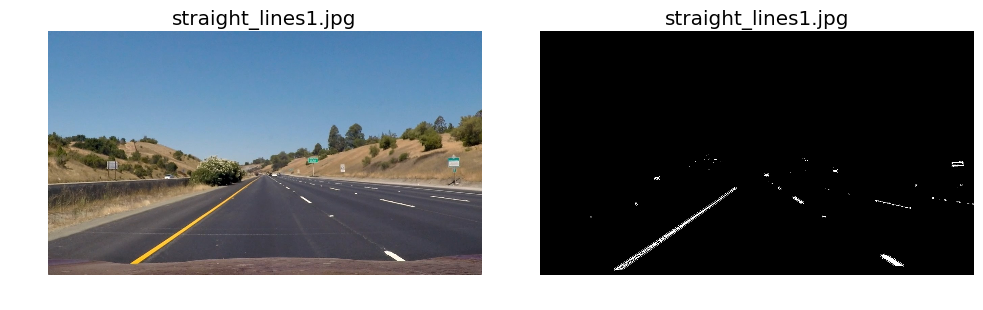

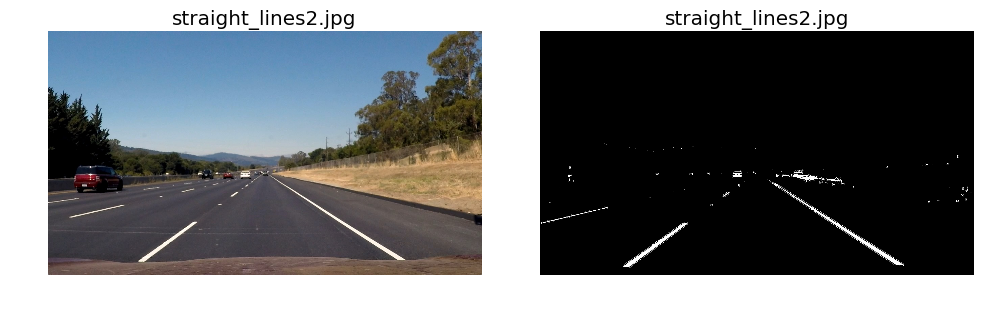

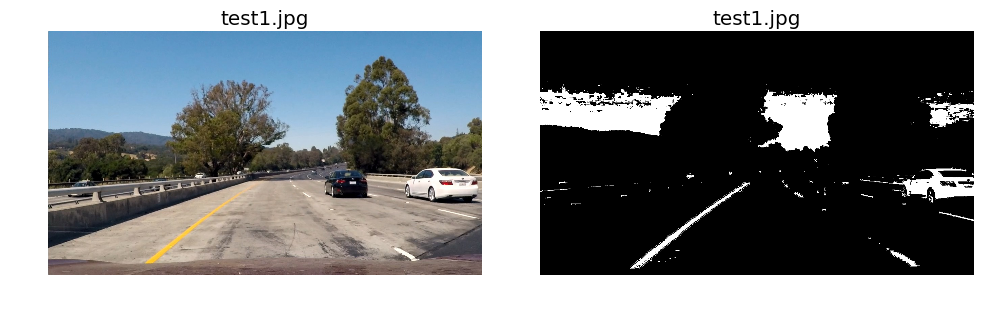

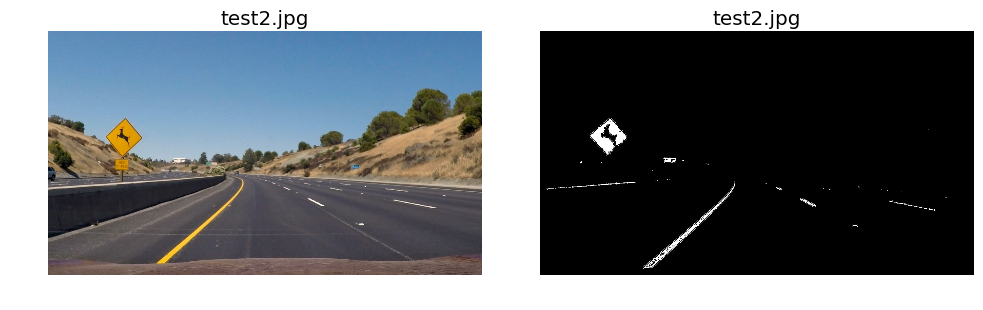

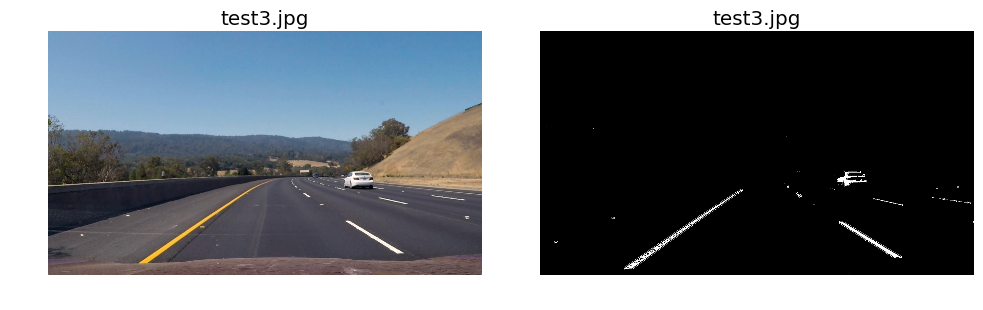

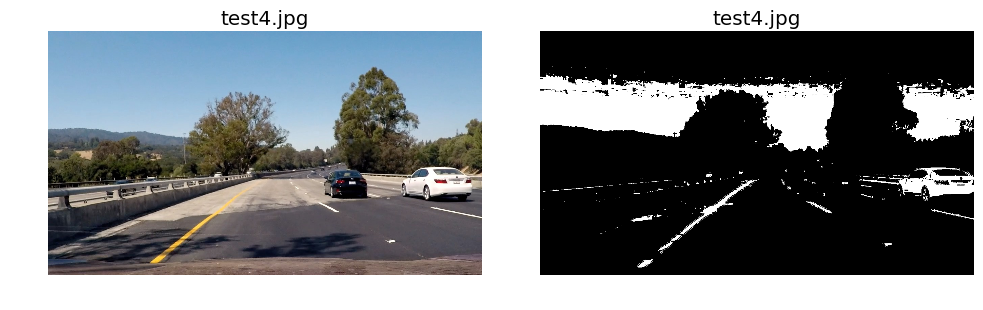

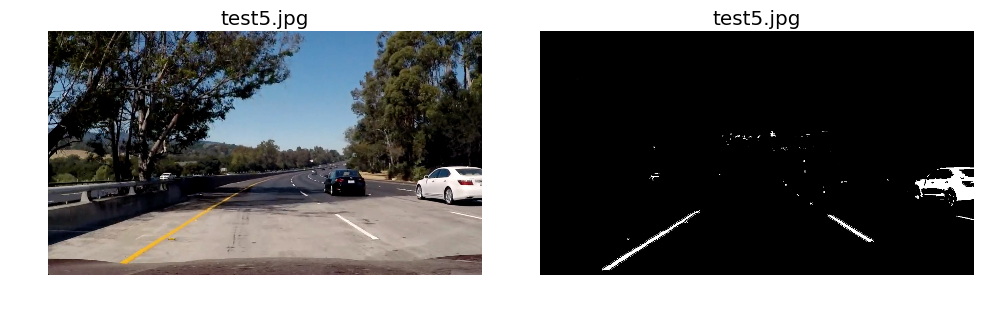

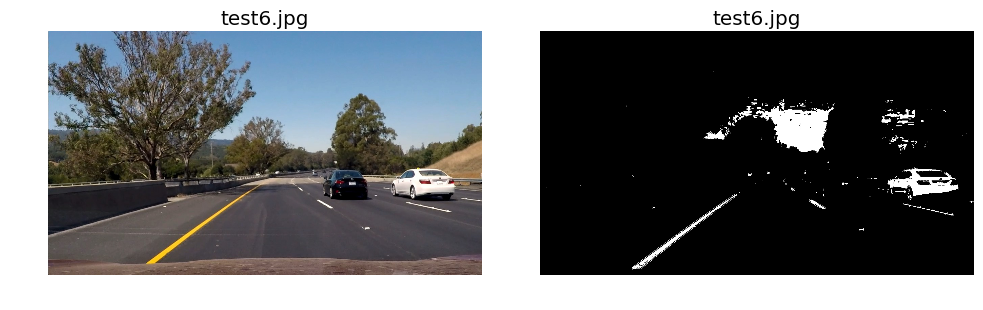

In [12]:
# Store images in test-images folder
images = glob.glob('test-images/*.jpg')

for image in tqdm(images):
    
    # Setup of a series of subplots
    plt.subplots(1,2, figsize=(10,10))
    plt.tight_layout()
    plt.axis('off')
    
    # Read image
    img = cv2.imread(image)

    # Plot orginal test image
    plt.subplot(1,2,1)
    plt.axis('off')
    plt.title(image.split('\\')[-1])
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)

    # Plot image that went through the image_pipeline
    plt.subplot(1,2,2)
    plt.axis('off')
    plt.title(image.split('\\')[-1])
    plt.imshow(image_pipe(img, mtx, dist), cmap='gray')
    
plt.show();

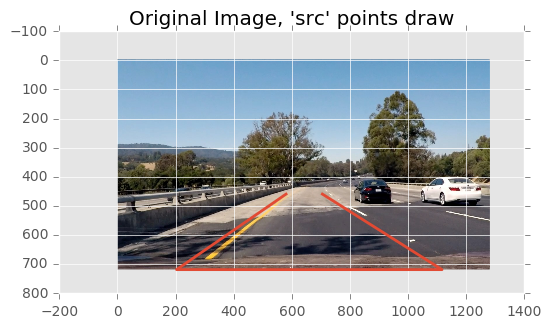

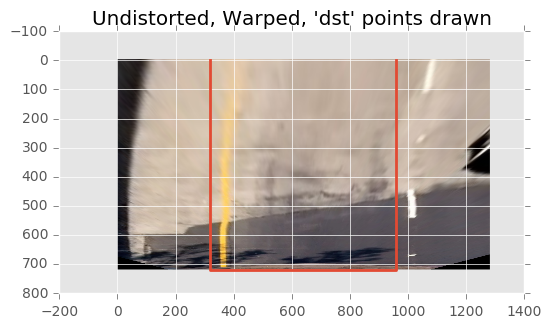

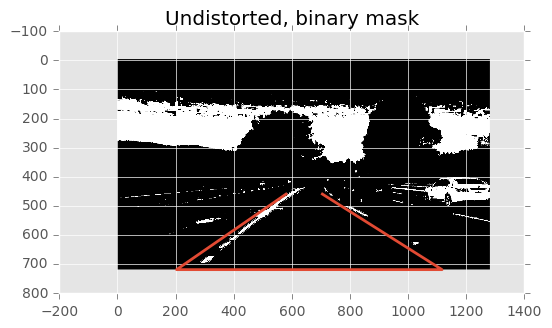

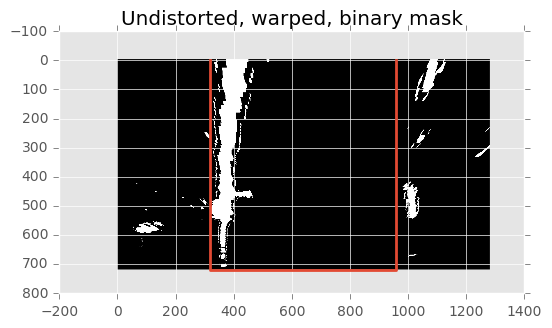

In [13]:
# Read in image, size
image = cv2.imread('test-images/test4.jpg')
image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
undistort = undistort_img(image_RGB, mtx, dist)
img_size = (undistort.shape[1], undistort.shape[0])

# Plot orginal image
plt.imshow(image_RGB)
plt.plot(src[:,0], src[:,1], linewidth=2.0)
plt.title('Original Image, \'src\' points draw')
plt.show()

# Plot undistored, warped image
plt.imshow(apply_perpspective(undistort, src, dst))
plt.plot(dst[:,0], dst[:,1], linewidth=2.0)
plt.title('Undistorted, Warped, \'dst\' points drawn')
plt.show()

# Plot undistorted, binary mask
image_binary = image_pipe(image, mtx, dist) # image_RGB since image_pipe undistorts
plt.imshow(image_binary, cmap='gray')
plt.plot(src[:,0], src[:,1], linewidth=2.0)
plt.title('Undistorted, binary mask')
plt.show()

# Plot undistored, warped binary mask
warp_binary = apply_perpspective(image_binary, src, dst)
plt.imshow(warp_binary, cmap='gray')
plt.plot(dst[:,0], dst[:,1], linewidth=2.0)
plt.title('Undistorted, warped, binary mask')
plt.show();

100%|██████████████████████████████████████████| 10/10 [00:08<00:00,  1.21it/s]


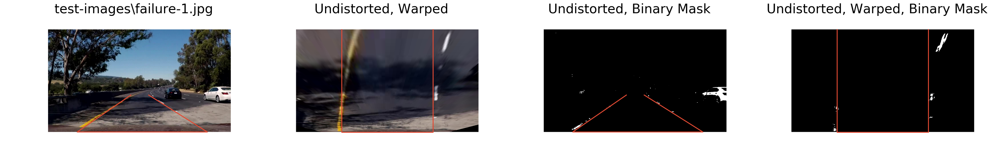

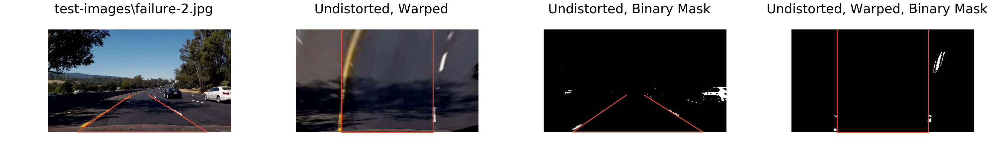

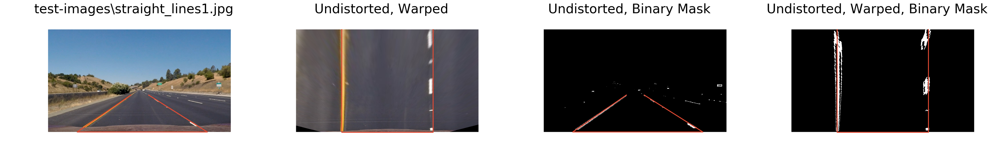

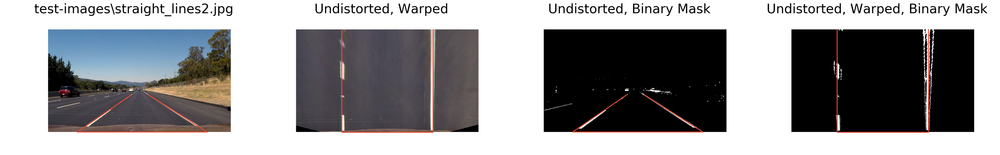

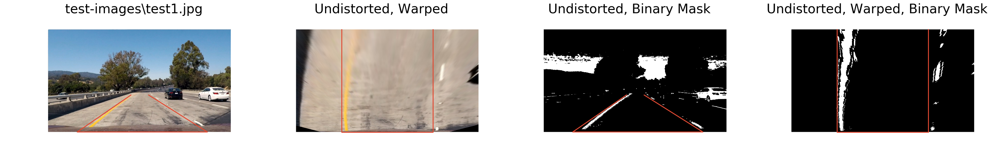

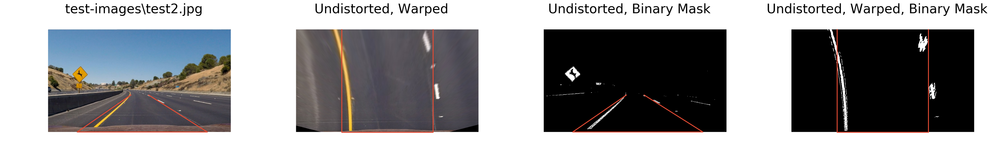

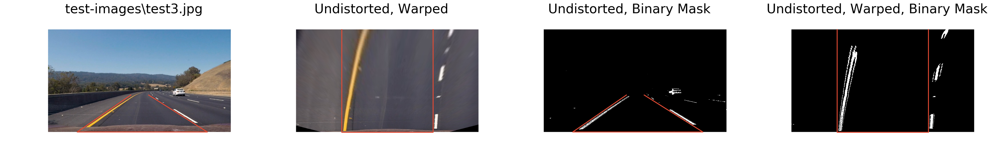

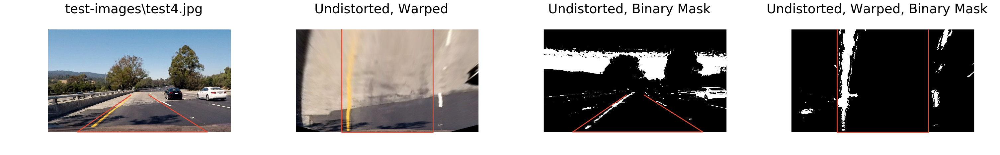

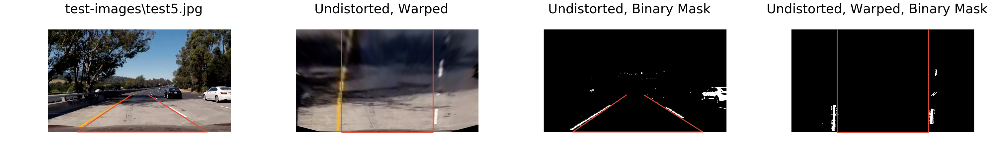

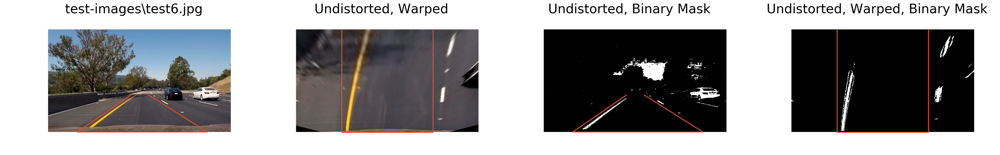

In [14]:
# Load images from test-images folder
images = glob.glob('test-images/*.jpg')

for image in tqdm(images):
    
    # Setup of a series of subplots
    plt.subplots(1,4, figsize=(30,20))
    plt.tight_layout()
    plt.axis('off')

    # Read in image, size
    title = image
    image = cv2.imread(image)
    image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    undistort = undistort_img(image_RGB, mtx, dist)
    img_size = (undistort.shape[1], undistort.shape[0])
    
    # Plot orginal image
    plt.subplot(1,4,1)
    plt.axis('off')
    plt.imshow(image_RGB)
    plt.plot(src[:,0], src[:,1], linewidth=2.0)
    plt.title(title, fontdict={'fontsize':28})

    # Plot undistored, warped image
    plt.subplot(1,4,2)
    plt.axis('off')
    plt.imshow(apply_perpspective(undistort, src, dst))
    plt.plot(dst[:,0], dst[:,1], linewidth=2.0)
    plt.title('Undistorted, Warped', fontdict={'fontsize':28})

    # Plot undistorted, binary mask
    plt.subplot(1,4,3)
    plt.axis('off')
    image_binary = image_pipe(image, mtx, dist) # image_RGB since image_pipe undistorts
    plt.imshow(image_binary, cmap='gray')
    plt.plot(src[:,0], src[:,1], linewidth=2.0)
    plt.title('Undistorted, Binary Mask', fontdict={'fontsize':28})

    # Plot undistored, warped binary mask
    plt.subplot(1,4,4)
    plt.axis('off')
    warp_binary = apply_perpspective(image_binary, src, dst)
    plt.imshow(warp_binary, cmap='gray')
    plt.plot(dst[:,0], dst[:,1], linewidth=2.0)
    plt.title('Undistorted, Warped, Binary Mask', fontdict={'fontsize':28})
    
plt.show();

### Create Line Class

In [15]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # x position of the lane line's base
        self.base_x = None
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        # average x values of the fitted line over the last n iterations
        self.bestx = None     
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = []  
        # polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        # radius of curvature of the line in some units
        self.radius_of_curvature = []
        # best radius - avg of last 'n' iterations
        self.best_radius = None
        # distance in meters of vehicle center from the line
        self.line_base_pos = []
        # average distance of vehicle's position over n iterations
        self.best_line_base_pos = None
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        # x values for detected line pixels
        self.allx = None  
        # y values for detected line pixels
        self.ally = None
        
    def set_detected(self, detected):
        self.detected = detected
    
    def update_vehicles_center(self, dist):
        # put in the most recent reading
        # output an updated average
        # reminds me of a PID controller
        self.line_base_pos.append(dist)
        # keep only the most recent 'n' elements
        if len(self.line_base_pos) > 30: self.line_base_pos.pop(-31)
        self.best_line_base_pos = np.average(self.line_base_pos)
        return self.best_line_base_pos
    
    def update_curvature(self, radius):
        # put in the most recent reading
        # output an updated average
        # reminds me of a PID controller
        self.radius_of_curvature.append(radius)
        # keep only the most recent 'n' elements
        if len(self.radius_of_curvature) > 75: self.radius_of_curvature.pop(-76)
        self.best_radius = np.average(self.radius_of_curvature)
        return self.best_radius
    
    def update_poly_coefs(self, polyfit):
        # pass in an array. we'll just see how this does
        self.best_fit.append(polyfit)
        if len(self.best_fit) > 15: self.best_fit.pop(-16)
        self.current_fit = np.mean(self.best_fit, axis=0)
        return self.current_fit
    

### Draw Lane and Stats Function

In [85]:
# Create Left and Right Line classes
Left = Line()
Right = Line()

def draw_lane_and_stats(binary_warped):
    
    """ Q U I C K   L A N E  S E A R C H """
    
    # Expedited Sliding Window Search. Take saved values from previous video frame
    while (Left.detected & Right.detected):
        # Assume you now have a new warped binary image 'binary_warped'
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        left_fit, right_fit = Left.current_fit, Right.current_fit # from previous frame
    
                         # Find indices of nonzero pixel values to the LEFT of the previous curve fit
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) 
                         + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                         # Find indices of nonzero pixel values to the RIGHT of the previous curve fit
                         & (nonzerox < (left_fit[0]*(nonzeroy**2) 
                         + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) 
                          + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                          & (nonzerox < (right_fit[0]*(nonzeroy**2) 
                          + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
        
        # Determine if there are enough indices (from above) to make a confident curve fit
        # if not, start a new sliding-window search
        min_indices = 10000 # Minimum number of nonzero pixel indices per lane line
        if ((len(left_lane_inds) < min_indices) | (len(right_lane_inds) < min_indices)):
            Left.detected = False
            Right.detected = False
            break
        
        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = Left.update_poly_coefs(np.polyfit(lefty, leftx, 2))
        right_fit = Right.update_poly_coefs(np.polyfit(righty, rightx, 2))
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        # Set the base x position for vehicle offset calcs
        Left.base_x = left_fitx[0]
        Right.base_x = right_fitx[0]
        
        # Set flags for lane detections and break the while loop
        Left.detected = True
        Right.detected = True
        break
    
    """ E X H A U S T I V E   W I N D O W    S E A R C H """
    
    # Start a brand new Sliding Window Search if Left and Right lane lines are not detected
    if not (Left.detected & Right.detected):
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[(int)(binary_warped.shape[0]/2):,:], axis=0)
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        Left.base_x = np.argmax(histogram[:midpoint])
        Right.base_x = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero() # Returns tuple: (y_pos, x_pos)
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = Left.base_x
        rightx_current = Right.base_x
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window verticiess in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) 
                            & (nonzeroy < win_y_high) 
                            & (nonzerox >= win_xleft_low) 
                            & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) 
                             & (nonzeroy < win_y_high) 
                             & (nonzerox >= win_xright_low) 
                             & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position/index
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # Fit a second order polynomial to each
        left_fit = Left.update_poly_coefs(np.polyfit(lefty, leftx, 2))
        right_fit = Right.update_poly_coefs(np.polyfit(righty, rightx, 2))

        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        # Set the 'lanes-detected' flag
        Left.detected = True
        Right.detected = True
    
    """ L A N E   A N D   L I N E   C O L O R I N G """
    
    out_img = np.zeros_like(np.dstack((binary_warped, binary_warped, binary_warped)))
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Prepare lane polygon vertices
    left_verts = [(x,y) for x,y in zip(left_fitx, ploty)]
    right_verts = [(x,y) for x,y in zip(right_fitx, ploty)]
    left = np.array(left_verts)
    right = np.array(right_verts)
    both = np.vstack((left, right[::-1]))

    # Draw lane polygon
    poly_lane = np.zeros_like(out_img)
    cv2.fillPoly(poly_lane, np.array([both], dtype=np.int32), (100,230,100))
    poly_and_lines_warped = cv2.addWeighted(out_img, 1, poly_lane, 1, 0)

    # Unwarp just the lane polygon and the lane-line colored pixels
    poly_and_lines = apply_unwarp(poly_and_lines_warped, dst, src)

    """ S T A T S  ---  C U R V A T U R E   A N D   O F F S E T """
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate curvature of left and right lanes 
    # Take the measurement at the bottom of the image where the polyfit line crosses
    # This is where the car is located
    y_eval = np.max(ploty)
    left_curverad  = Left.update_curvature(((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix 
                                               + left_fit_cr[1])**2)**1.5) 
                                               / np.absolute(2*left_fit_cr[0]))
    right_curverad = Right.update_curvature(((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix 
                                                + right_fit_cr[1])**2)**1.5) 
                                                / np.absolute(2*right_fit_cr[0]))
    curv_diff = np.absolute(left_curverad-right_curverad) \
                / np.min([left_curverad,right_curverad])*100
    # Assign color to curvature text
    if curv_diff < 10: curv_color = (100,210,100)
    elif curv_diff < 17: curv_color = (244, 173, 66)
    else: curv_color = (244, 116, 66)

    # Vehicle's offset from center. Neg. value means it's to the left of center
    avg_leftx_rightx = np.average([Left.base_x, Right.base_x])
    cen_offset = Left.update_vehicles_center(xm_per_pix*(avg_leftx_rightx - binary_warped.shape[1]/2))
    # Assign color to curvature text
    if cen_offset < 0.2: cen_color = (100,210,100)
    elif cen_offset < 0.4: cen_color = (244, 173, 66)
    else: cen_color = (244, 116, 66)

    # Create a nice backgound poly to write text on top
    poly_stats = np.zeros_like(poly_lane)
    width, height = warp_binary.shape[1], warp_binary.shape[0]
    # Start with Bottom-Left -> CW
    verts = np.array([[(0,height*0.17),(0,0),(width*0.48,0),(width*0.48,height*0.17)]], np.int32)
    cv2.fillPoly(poly_stats, verts, (20,20,20))
    final_img = cv2.addWeighted(poly_and_lines, 0.4, poly_stats, 0.6, 0.7)

    # Put the values of curvature and vehicle offset on the final image
    img_str_curv = 'Radius of Curvature: {:4.0f}m' \
                    .format(np.average([left_curverad, right_curverad]), align='>')
    img_str_offset = 'Vehicle\'s Center Offset: {:2.2f}m'.format(cen_offset, align='>')
    font = cv2.FONT_HERSHEY_COMPLEX
    cv2.putText(final_img, img_str_curv, (25,50), font, 1, curv_color, 3)
    cv2.putText(final_img, img_str_offset, (25,100), font, 1, cen_color,3)
    
    return final_img

## Full Image Pipeline

In [79]:
def apply_lane_find(img):
    """
    This function is the overall 'wrapper' when processing the driving video
    """
    # Return an undistorted, combined-thresholded binary image
    combined_binary = image_pipe(img, mtx, dist)

    # Warp the returned combined-thresholded binary image
    binary_warped = apply_perpspective(combined_binary, src, dst)

    # Return an image with the lane poly, colored line-pixels, and stats drawn
    lane_draw = draw_lane_and_stats(binary_warped)
    
    # Overlay lane_draw onto final image
    final_image = cv2.addWeighted(img, 0.8, lane_draw, 0.6, 0)
    
    return final_image

## Short Test Clip

In [80]:
project_output = 'output-videos/project-video-output-short.mp4'
clip1 = VideoFileClip('project-1-videos/challenge.mp4')
proj_clip = clip1.fl_image(apply_lane_find)
%time proj_clip.write_videofile(project_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

[MoviePy] >>>> Building video output-videos/project-video-output-short.mp4
[MoviePy] Writing video output-videos/project-video-output-short.mp4


100%|████████████████████████████████████████| 251/251 [01:00<00:00,  4.20it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output-videos/project-video-output-short.mp4 

Wall time: 1min 1s


## Full Test Clip - Used for Project Submission

In [24]:
project_output = 'output-videos/output-project-video.mp4'
clip1 = VideoFileClip('project-4-videos/project-video.mp4')
proj_clip = clip1.fl_image(apply_lane_find)
%time proj_clip.write_videofile(project_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

[MoviePy] >>>> Building video output-videos/output-project-video.mp4
[MoviePy] Writing video output-videos/output-project-video.mp4


100%|█████████████████████████████████████▉| 1260/1261 [05:17<00:00,  4.10it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output-videos/output-project-video.mp4 

Wall time: 5min 18s
